In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import tensorflow as tf

In [3]:
tf.test.gpu_device_name()
print(tf.config.list_physical_devices())

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
df1 = pd.read_csv('2017.csv')
df2 = pd.read_csv('41.094064, 29.0... 2017-01-01 to 2017-12-31 (2) (1).csv')

In [5]:
df2 = df2.cloudcover

In [6]:
df = pd.concat([df1, df2], axis= 1)

In [7]:
df = df.drop('Unnamed: 23', 1)

In [8]:
df = df_no_zero = df.loc[df['DHI']!= 0 ]
assert len(df_no_zero['DHI'])==len(df_no_zero['GHI']), "Some DHI 0s where GHI is not 0"
df['DHI_log'] = np.log(df['DHI'])
df['GHI_log'] = np.log(df['GHI'])
df['cloud_cover_log'] = np.log(df['cloudcover']+0.0000001)

In [9]:
df.shape

(4329, 27)

In [10]:
df.head()
df.describe()

,Year,Month,Day,Hour,Minute,Temperature,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Type,...,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed,cloudcover,DHI_log,GHI_log,cloud_cover_log
count,4329.0,4329.000000,4329.000000,4329.000000,4329.0,4329.000000,4329.000000,4329.000000,4329.000000,4329.000000,...,4329.000000,4329.000000,4329.000000,4329.000000,4329.000000,4329.000000,4329.000000,4329.000000,4329.000000,4329.000000
mean,2017.0,6.435435,15.769231,9.573574,30.0,17.209610,116.100023,599.567337,456.863479,2.353892,...,59.037147,0.160973,1012.705706,2.062809,136.225225,3.376738,45.354655,4.388297,5.100837,0.041466
std,0.0,3.194634,8.796640,3.566014,0.0,7.480998,57.491178,235.327490,275.317986,2.606415,...,18.535605,0.138586,5.729360,0.868890,108.871485,1.704461,36.200309,1.047639,1.448784,7.627138
min,2017.0,1.000000,1.000000,3.000000,30.0,-2.900000,2.000000,0.000000,2.000000,0.000000,...,18.380000,0.100000,998.000000,0.400000,0.000000,0.400000,0.000000,0.000000,0.000000,-16.118096
25%,2017.0,4.000000,8.000000,7.000000,30.0,11.500000,77.000000,461.000000,231.000000,0.000000,...,45.940000,0.120000,1009.000000,1.400000,42.000000,2.000000,2.700000,3.871201,4.143135,0.993252
50%,2017.0,6.000000,16.000000,10.000000,30.0,17.400000,111.000000,662.000000,441.000000,2.000000,...,61.540000,0.140000,1012.000000,2.000000,80.000000,3.100000,42.800000,4.615121,5.533389,3.756538
75%,2017.0,9.000000,23.000000,13.000000,30.0,23.800000,148.000000,783.000000,682.000000,4.000000,...,73.310000,0.140000,1016.000000,2.700000,233.000000,4.500000,85.200000,5.081404,6.309918,4.445001
max,2017.0,12.000000,31.000000,17.000000,30.0,34.200000,414.000000,976.000000,996.000000,12.000000,...,88.990000,0.870000,1031.000000,4.600000,360.000000,9.500000,99.300000,6.159095,6.903747,4.598146


Text(0.5, 1.0, 'Missing value in the dataset')

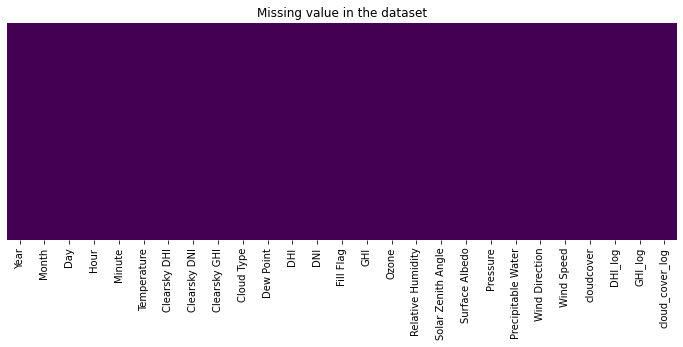

In [11]:
#Visualize summary of null values.
plt.figure(figsize=(12,4))
sns.heatmap(df.isnull(),cbar=False,cmap='viridis',yticklabels=False)
plt.title('Missing value in the dataset')

<AxesSubplot:>

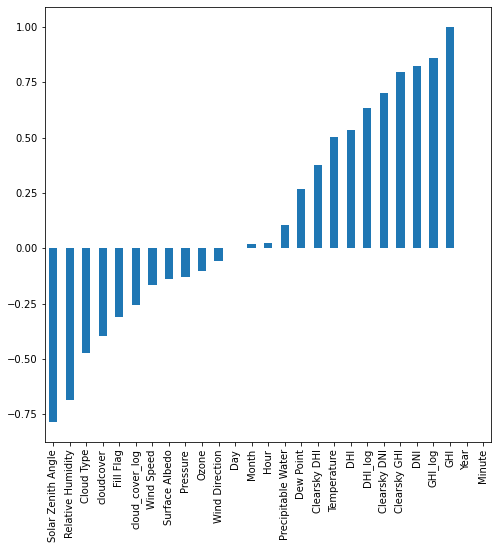

In [12]:
#correlation between columns
df.corr()["GHI"].sort_values().plot(kind="bar", figsize=(8,8))

<AxesSubplot:>

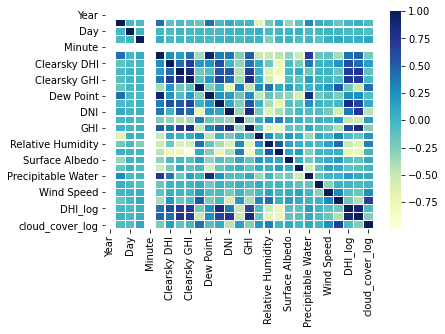

In [13]:
#Correlation Plot more visualize version.
corr = df.corr()
sns.heatmap(corr,cmap="YlGnBu", linewidths=.5)

In [14]:
independent_values = df.drop(['GHI','Year','Day','Month','Hour','Minute'], axis = 1)
target =df['GHI']

In [15]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(independent_values,target,test_size = 0.33)

In [16]:
import statsmodels.api as sm

In [17]:
x_train_sm = sm.add_constant(x_train)

In [18]:
lr=sm.OLS(y_train,x_train_sm).fit()

In [19]:
lr

In [20]:
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    GHI   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     3995.
Date:                Wed, 11 May 2022   Prob (F-statistic):               0.00
Time:                        02:16:12   Log-Likelihood:                -15566.
No. Observations:                2900   AIC:                         3.118e+04
Df Residuals:                    2878   BIC:                         3.131e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               -258.6609    273

In [21]:
x_train,x_test,y_train,y_test = train_test_split(independent_values,target,test_size = 0.2)

In [22]:
x_train_sm = sm.add_constant(x_train)
lr=sm.OLS(y_train,x_train_sm).fit()
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    GHI   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     4787.
Date:                Wed, 11 May 2022   Prob (F-statistic):               0.00
Time:                        02:16:12   Log-Likelihood:                -18612.
No. Observations:                3463   AIC:                         3.727e+04
Df Residuals:                    3441   BIC:                         3.740e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               -320.7950    251

In [23]:
x_train_sm = sm.add_constant(x_train)
lr=sm.OLS(y_train,x_train_sm).fit()
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    GHI   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     4787.
Date:                Wed, 11 May 2022   Prob (F-statistic):               0.00
Time:                        02:16:12   Log-Likelihood:                -18612.
No. Observations:                3463   AIC:                         3.727e+04
Df Residuals:                    3441   BIC:                         3.740e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               -320.7950    251

In [24]:
print('Train', x_train.shape, y_train.shape)
print('Test', x_test.shape, y_test.shape)

Train (3463, 21) (3463,)
Test (866, 21) (866,)


In [25]:
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import SelectKBest

# configure to select all features
fs = SelectKBest(score_func=f_regression, k='all')
# learn relationship from training data
fs.fit(x_train, y_train)
# transform train input data
X_train_fs = fs.transform(x_train)
# transform test input data
X_test_fs = fs.transform(x_test)


Feature 0: 1176.843516
Feature 1: 555.563991
Feature 2: 3342.494224
Feature 3: 5959.322424
Feature 4: 960.307240
Feature 5: 271.497734
Feature 6: 1362.672118
Feature 7: 7354.815877
Feature 8: 367.422092
Feature 9: 39.699741
Feature 10: 3052.294505
Feature 11: 5528.016328
Feature 12: 65.355891
Feature 13: 56.101398
Feature 14: 39.275508
Feature 15: 15.318037
Feature 16: 77.861083
Feature 17: 632.800857
Feature 18: 2305.660664
Feature 19: 9948.448916
Feature 20: 237.304108


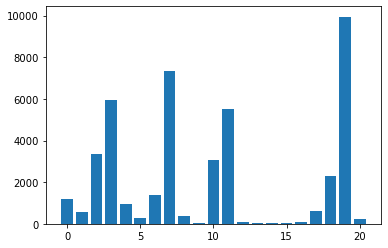

In [26]:
import matplotlib.pyplot as pyplot
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

Feature 0: 0.198324
Feature 1: 0.418196
Feature 2: 0.568467
Feature 3: 2.754595
Feature 4: 0.283806
Feature 5: 0.097549
Feature 6: 1.936099
Feature 7: 0.874046
Feature 8: 0.144200
Feature 9: 0.051469
Feature 10: 0.374147
Feature 11: 1.178421
Feature 12: 0.135545
Feature 13: 0.051092
Feature 14: 0.032204
Feature 15: 0.032627
Feature 16: 0.043598
Feature 17: 0.160255
Feature 18: 1.947116
Feature 19: 5.811692
Feature 20: 0.127299


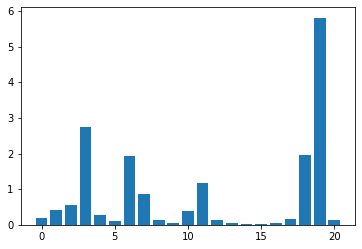

In [27]:
# example of mutual information feature selection for numerical input data
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from matplotlib import pyplot
 
# feature selection
def select_features(X_train, y_train, X_test):
    # configure to select all features
    fs = SelectKBest(score_func=mutual_info_regression, k='all')
    # learn relationship from training data
    fs.fit(x_train, y_train)
    # transform train input data
    x_train_fs = fs.transform(x_train)
    # transform test input data
    x_test_fs = fs.transform(x_test)
    return x_train_fs, x_test_fs, fs
 

# split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(independent_values,target, test_size=0.33, random_state=1)
# feature selection
x_train_fs, x_test_fs, fs = select_features(x_train, y_train, x_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

In [28]:
# evaluation of a model using all input features
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
# split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(independent_values,target, test_size=0.33, random_state=1)
# fit the model
model = LinearRegression()
model.fit(x_train, y_train)
# evaluate the model
yhat = model.predict(x_test)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('MAE: %.3f' % mae)

MAE: 42.954


In [29]:
# feature selection
def select_features(x_train, y_train, x_test):
    # configure to select a subset of features
    fs = SelectKBest(score_func=f_regression, k=10)
    # learn relationship from training data
    fs.fit(x_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(x_train)
    # transform test input data
    x_test_fs = fs.transform(x_test)
    return x_train_fs, x_test_fs, fs

In [30]:
# evaluation of a model using 10 features chosen with correlation
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

# fit the model
model = LinearRegression()
model.fit(x_train_fs, y_train)
# evaluate the model
yhat = model.predict(x_test_fs)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('MAE: %.3f' % mae)

MAE: 42.954


In [48]:
# evaluation of a model using 15 features chosen with correlation
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
 
# feature selection
def select_features(x_train, y_train, x_test):
    # configure to select a subset of features
    fs = SelectKBest(score_func=f_regression, k=15)
    # learn relationship from training data
    fs.fit(x_train, y_train)
    # transform train input data
    x_train_fs = fs.transform(x_train)
    # transform test input data
    x_test_fs = fs.transform(x_test)
    return x_train_fs, x_test_fs, fs

# split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(independent_values,target, test_size=0.33, random_state=1)
# feature selection
x_train_fs, x_test_fs, fs = select_features(x_train, y_train, x_test)
# fit the model
model = LinearRegression()
model.fit(x_train_fs, y_train)
# evaluate the model
yhat = model.predict(x_test_fs)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('MAE: %.3f' % mae)

MAE: 42.990


In [52]:
# evaluation of a model using 88 features chosen with mutual information
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
 
def select_features(x_train, y_train, x_test):
    # configure to select a subset of features
    fs = SelectKBest(score_func=mutual_info_regression, k=21)
    # learn relationship from training data
    fs.fit(x_train, y_train)
    # transform train input data
    x_train_fs = fs.transform(x_train)
    # transform test input data
    x_test_fs = fs.transform(x_test)
    return x_train_fs, x_test_fs, fs

# split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(independent_values,target, test_size=0.33, random_state=1)
# feature selection
x_train_fs, x_test_fs, fs = select_features(x_train, y_train, x_test)
# fit the model
model = LinearRegression()
model.fit(x_train_fs, y_train)
# evaluate the model
yhat = model.predict(x_test_fs)
# evaluate predictions
mae = mean_absolute_error(y_test, yhat)
print('MAE: %.3f' % mae)

MAE: 42.954


In [55]:
# compare different numbers of features selected using mutual information
from sklearn.datasets import make_regression
from sklearn.model_selection import RepeatedKFold
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

# define the evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define the pipeline to evaluate
model = LinearRegression()
fs = SelectKBest(score_func=mutual_info_regression)
pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])
# define the grid
grid = dict()
grid['sel__k'] = [i for i in range(independent_values.shape[1]-20, independent_values.shape[1]+1)]
# define the grid search
search = GridSearchCV(pipeline, grid, scoring='neg_mean_squared_error', n_jobs=-1, cv=cv)
# perform the search
results = search.fit(independent_values,target)
# summarize best
print('Best MAE: %.3f' % results.best_score_)
print('Best Config: %s' % results.best_params_)
# summarize all
means = results.cv_results_['mean_test_score']
params = results.cv_results_['params']
for mean, param in zip(means, params):
    print(">%.3f with: %r" % (mean, param))

Best MAE: -2719.268
Best Config: {'sel__k': 21}
>-21404.580 with: {'sel__k': 1}
>-16622.322 with: {'sel__k': 2}
>-7805.092 with: {'sel__k': 3}
>-4167.348 with: {'sel__k': 4}
>-3891.190 with: {'sel__k': 5}
>-3837.825 with: {'sel__k': 6}
>-3397.990 with: {'sel__k': 7}
>-3092.547 with: {'sel__k': 8}
>-3089.058 with: {'sel__k': 9}
>-2989.234 with: {'sel__k': 10}
>-2987.853 with: {'sel__k': 11}
>-2947.960 with: {'sel__k': 12}
>-2863.091 with: {'sel__k': 13}
>-2807.337 with: {'sel__k': 14}
>-2780.033 with: {'sel__k': 15}
>-2728.669 with: {'sel__k': 16}
>-2728.541 with: {'sel__k': 17}
>-2728.580 with: {'sel__k': 18}
>-2726.463 with: {'sel__k': 19}
>-2725.709 with: {'sel__k': 20}
>-2719.268 with: {'sel__k': 21}


>2 -102.786 (3.840)
>3 -70.559 (8.195)
>4 -51.593 (1.623)
>5 -49.852 (1.559)
>6 -49.635 (1.553)
>7 -46.522 (1.710)
>8 -44.241 (1.739)
>9 -44.224 (1.735)
>10 -42.977 (1.632)
>11 -42.960 (1.609)
>12 -42.723 (1.585)
>13 -41.990 (1.621)
>14 -41.490 (1.664)
>15 -41.355 (1.659)
>16 -41.069 (1.649)
>17 -41.073 (1.634)
>18 -41.061 (1.621)
>19 -41.059 (1.639)
>20 -41.047 (1.645)
>21 -41.011 (1.637)


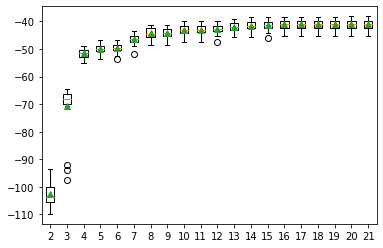

In [57]:
# compare different numbers of features selected using mutual information
from numpy import mean
from numpy import std
from sklearn.datasets import make_regression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from matplotlib import pyplot

# define number of features to evaluate
num_features = [i for i in range(independent_values.shape[1]-19, independent_values.shape[1]+1)]
# enumerate each number of features
results = list()
for k in num_features:
    # create pipeline
    model = LinearRegression()
    fs = SelectKBest(score_func=mutual_info_regression, k=k)
    pipeline = Pipeline(steps=[('sel',fs), ('lr', model)])
    # evaluate the model
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(pipeline, independent_values, target, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
    results.append(scores)
    # summarize the results
    print('>%d %.3f (%.3f)' % (k, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=num_features, showmeans=True)
pyplot.show()

C:\Users\safix\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\safix\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


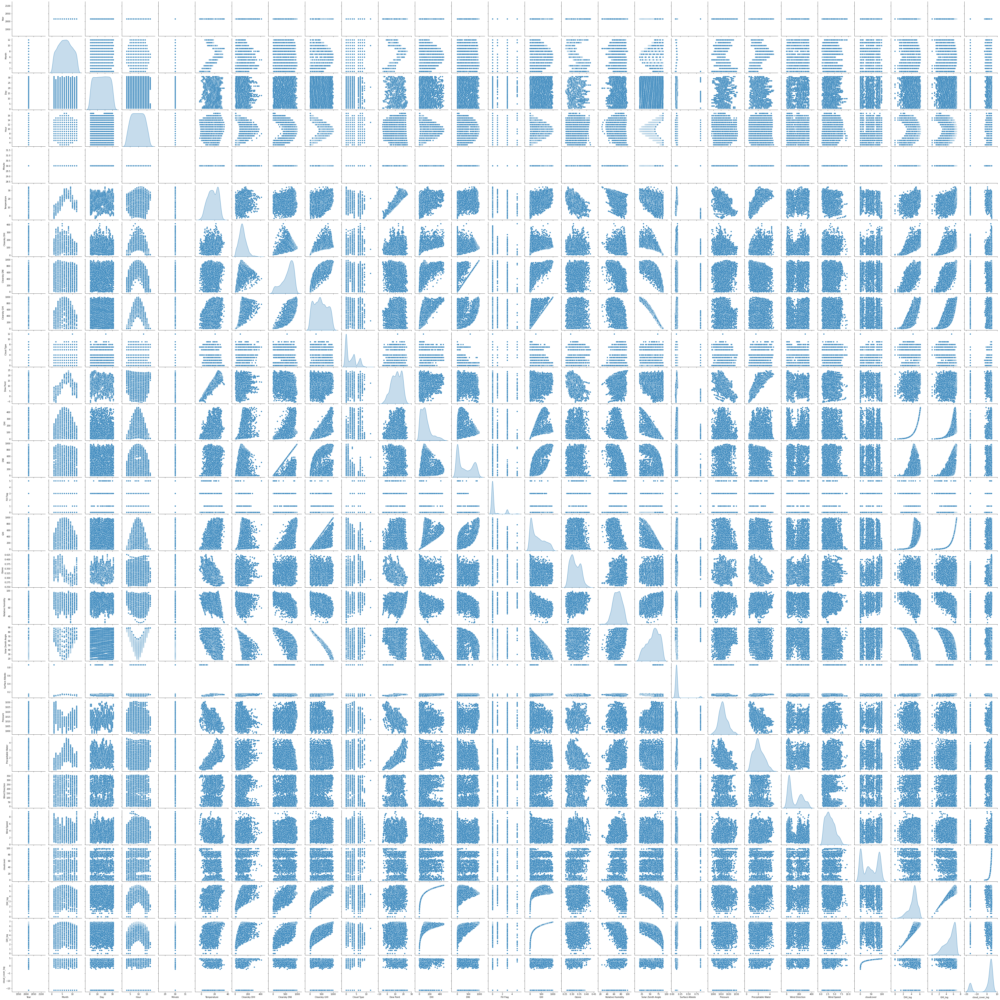

In [58]:
sns.pairplot(data=df, diag_kind='kde')

In [63]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [64]:
x_train=sc.fit_transform(x_train)
x_test=sc.transform(x_test)

In [66]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

#Create a LinearRegression object
lr= LinearRegression()
#Fit X and y 
lr.fit(x_train, y_train)
ypred = lr.predict(x_test)
#Metrics to evaluate your model 
r2_score(y_test, ypred), mean_absolute_error(y_test, ypred), np.sqrt(mean_squared_error(y_test, ypred))

(0.96406286290456, 42.954415495576825, 53.95683131714182)

In [67]:
dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)
yhat = dt.predict(x_test)
r2_score(y_test, yhat), mean_absolute_error(y_test, yhat), np.sqrt(mean_squared_error(y_test, yhat))

(0.9999918456308643, 0.370888733379986, 0.8127741503358505)

In [68]:
dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)
yhat = dt.predict(x_test)
r2_score(y_test, yhat), mean_absolute_error(y_test, yhat), np.sqrt(mean_squared_error(y_test, yhat))

(0.9999921997930831, 0.3561931420573828, 0.794927938162912)

In [82]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import QuantileTransformer
model = RandomForestRegressor()
#transforming target variable through quantile transformer
ttr = TransformedTargetRegressor(regressor=model, transformer=QuantileTransformer(output_distribution='normal'))
ttr.fit(x_train, y_train)
yhat = ttr.predict(x_test)


In [86]:
r2_score(y_test, yhat), mean_absolute_error(y_test, yhat), np.sqrt(mean_squared_error(y_test, yhat))

(0.9999972428032915, 0.2507575347699245, 0.47261616816449065)

In [90]:
from sklearn.ensemble import GradientBoostingRegressor
import lightgbm as lgbm
import xgboost as xg


#generic function to fit model and return metrics for every algorithm
def boost_models(x):
    #transforming target variable through quantile transformer
    regr_trans = TransformedTargetRegressor(regressor=x, transformer=QuantileTransformer(output_distribution='normal'))
    regr_trans.fit(x_train, y_train)
    yhat = regr_trans.predict(x_test)
    algoname= x.__class__.__name__
    return algoname, round(r2_score(y_test, yhat),3), round(mean_absolute_error(y_test, yhat),2), round(np.sqrt(mean_squared_error(y_test, yhat)),2)

algo=[GradientBoostingRegressor(), lgbm.LGBMRegressor(), xg.XGBRFRegressor()]
score=[]
for a in algo:
    score.append(boost_models(a))

 #Collate all scores in a table
pd.DataFrame(score, columns=['Model', 'Score', 'MAE', 'RMSE'])

,Model,Score,MAE,RMSE
0,GradientBoostingRegressor,1.0,2.12,3.19
1,LGBMRegressor,1.0,1.25,2.12
2,XGBRFRegressor,1.0,2.08,3.20
